In [1]:
include("speciale_tools.jl")
import JLD
import PyPlot

In [5]:

min_vv = -19
max_vv = 4

min_vh = -26
max_vh = -3

min_r = -10
max_r = 1;

min_h = -10
max_h = 100;



## Ribe 

In [2]:
folder = "/home/data/simon/processed/177_jutlandS_winter2020/ribe" 

dem_nan = 40
co_gamma = JLD.load(joinpath(folder,"21VV_coher.jld"),"data")[end:-1:1,:]
pre_gamma = JLD.load(joinpath(folder,"23VV_coher.jld"),"data")[end:-1:1,:]

VV_paths = [joinpath(folder,string(i)*"VV_itens.jld") for i=1:3]
VV = [JLD.load(path,"data")[end:-1:1,:] for path in VV_paths]
VH_paths = [joinpath(folder,string(i)*"VH_itens.jld") for i=1:3]
VH = [JLD.load(path,"data")[end:-1:1,:] for path in VH_paths];
heights = JLD.load(joinpath(folder,"heights.jld"),"data")[end:-1:1,:].-dem_nan;

In [3]:


filt = SlcUtil.temporal_filter([VV[1],VH[1]],5);

VV = SlcUtil.temporal_filter(VV,5);
VH = SlcUtil.temporal_filter(VH,5);

VV[1] = filt[1]
VH[1] = filt[2];

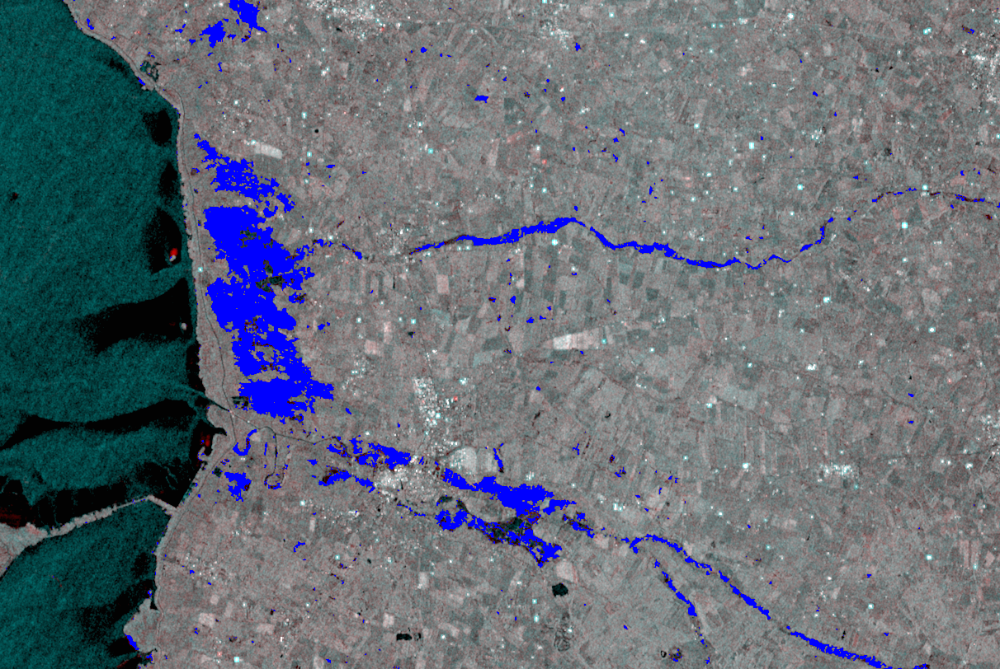

In [6]:
flood_band = 10 .*log10.(VV[1][:,500:end]);
ref_band = 10 .*log10.(VV[3][:,500:end]);

final_mask, thresholds = HSBA_floodmask(flood_band,ref_band)

bands = [elem[:,500:end] for elem in VV]
img = pretty_img(bands ,min_vv,max_vv);
add_mask(img, final_mask ,(0,0,1))

In [7]:
thresholds

3-element Array{Float64,1}:
 -16.025             
 -13.287957175076007 
  -1.4429257810115816

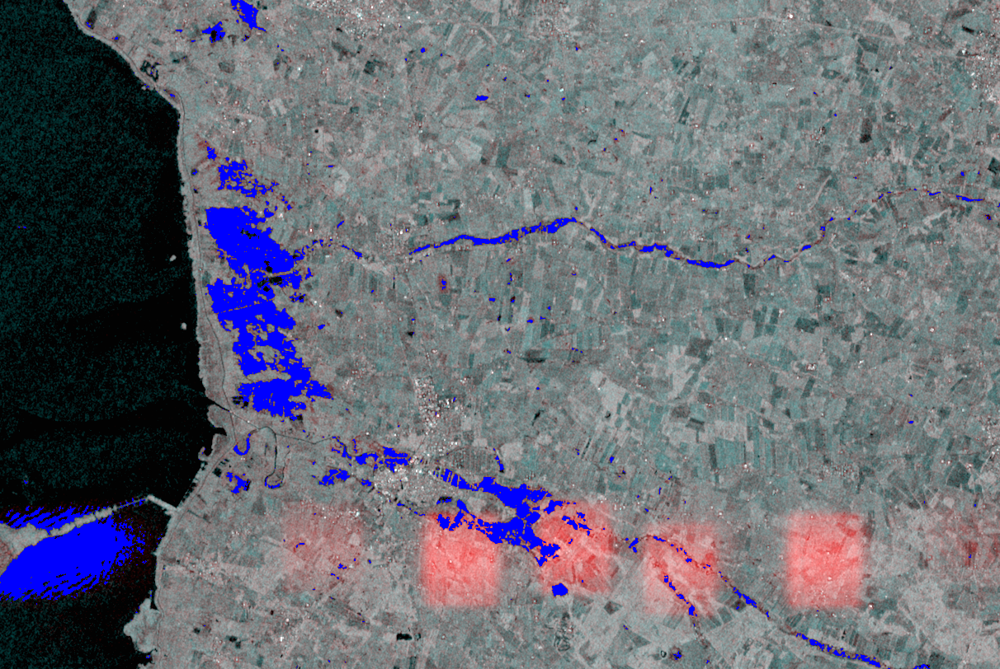

In [10]:
flood_band = 10 .*log10.(VH[1][:,500:end]);
ref_band = 10 .*log10.(VH[3][:,500:end]);

final_mask, thresholds = HSBA_floodmask(flood_band,ref_band)

bands = [elem[:,500:end] for elem in VH]
img = pretty_img(bands ,min_vh,max_vh);
add_mask(img, final_mask ,(0,0,1))

In [11]:
thresholds

3-element Array{Float64,1}:
 -24.03              
 -22.828027343749998 
  -1.1674560546875001

### Vejle

In [12]:
folder = "/home/data/simon/processed/66_fyn_winter2020/vejle" # desend

dem_nan = 40

co_gamma = JLD.load(joinpath(folder,"21VV_coher.jld"),"data")
pre_gamma = JLD.load(joinpath(folder,"23VV_coher.jld"),"data")

VV_paths = [joinpath(folder,string(i)*"VV_itens.jld") for i=1:3]
VV = [JLD.load(path,"data") for path in VV_paths]
VH_paths = [joinpath(folder,string(i)*"VH_itens.jld") for i=1:3]
VH = [JLD.load(path,"data") for path in VH_paths];
heights = JLD.load(joinpath(folder,"heights.jld"),"data").-dem_nan;

line_sample = JLD.load(joinpath(folder,"line_sample.jld"))
samples = collect(line_sample["samples"]) #[1:7:end]
lines = collect(line_sample["lines"]) #[1:2:end]
lut = JLD.load(joinpath(folder,"21_lut.jld"),"data");

In [13]:
filt = SlcUtil.temporal_filter([VV[1],VH[1]],5);

VV = SlcUtil.temporal_filter(VV,5);
VH = SlcUtil.temporal_filter(VH,5);

VV[1] = filt[1]
VH[1] = filt[2];

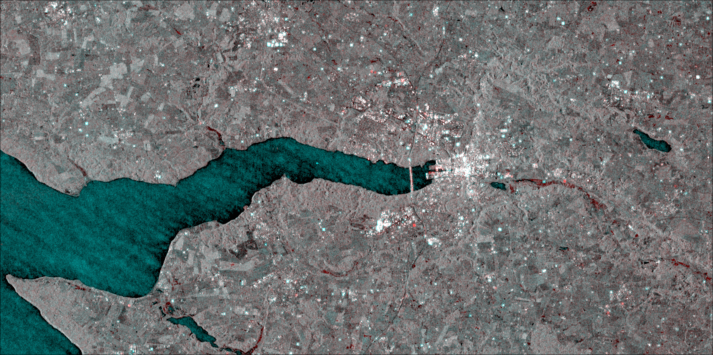

In [15]:
flood_band = 10 .*log10.(VV[1]);
ref_band = 10 .*log10.(VV[3]);

final_mask, thresholds = HSBA_floodmask(flood_band,ref_band)

img = pretty_img(VV ,min_vv,max_vv);
add_mask(img, final_mask ,(0,0,1))

In [16]:
thresholds

3-element Array{Float64,1}:
 -13.97             
  23.294951171875034
   1.679064941406251

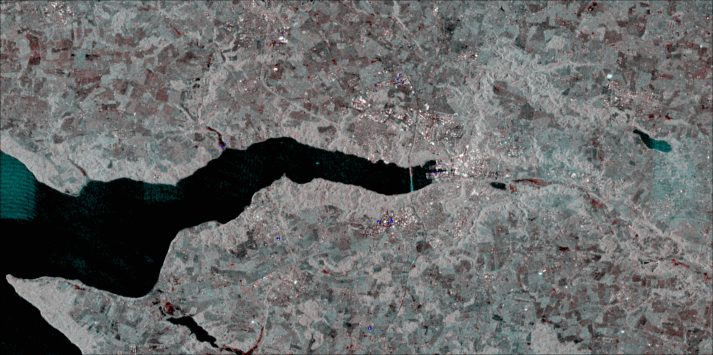

In [17]:
flood_band = 10 .*log10.(VH[1]);
ref_band = 10 .*log10.(VH[3]);

final_mask, thresholds = HSBA_floodmask(flood_band,ref_band)

img = pretty_img(VH ,min_vh,max_vh);
add_mask(img, final_mask ,(0,0,1))

In [18]:
thresholds

3-element Array{Float64,1}:
 -26.365000000000002 
 -19.036250000000003 
  -1.1187500000000001

In [19]:
sum(final_mask)

190

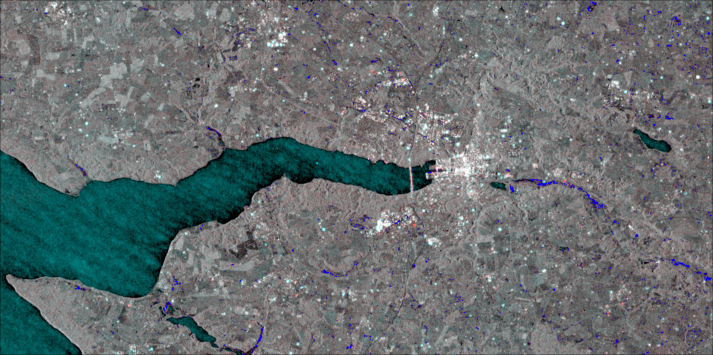

In [96]:
t_VV = [-16,-14.8,-5]

flood_band = 10 .*log10.(VV[1]);
ref_band = 10 .*log10.((VV[2].+VV[3])./2);

VVfinal_mask, VVflood_mask, VVref_mask = No_HSBA_floodmask(flood_band,ref_band,t_VV)

img = pretty_img(VV ,min_vv,max_vv);
img_flood = add_mask(img, VVflood_mask ,(0,0,1))
img_ref = add_mask(img, VVref_mask ,(0,0,1))
img_final = add_mask(img, VVfinal_mask ,(0,0,1))


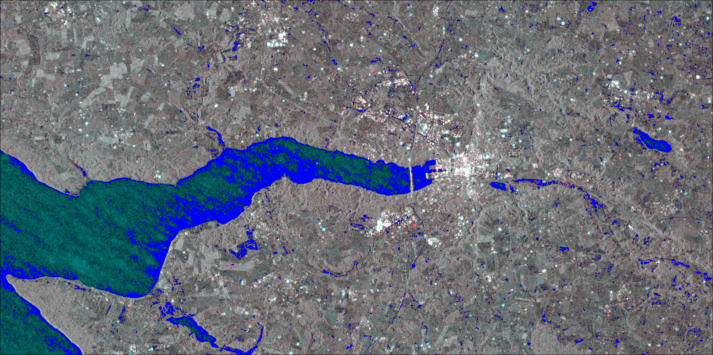

In [97]:
img_flood

In [98]:
FileIO.save("testVV.png",img)
FileIO.save("testVV_flood.png",img_flood)

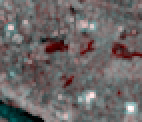

In [99]:
img[210:270,end-150:end-80]

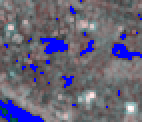

In [100]:
img_flood[210:270,end-150:end-80]

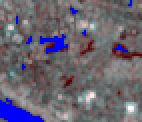

In [101]:
img_ref[210:270,end-150:end-80]

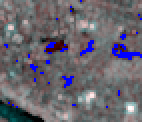

In [102]:
img_final[210:270,end-150:end-80]

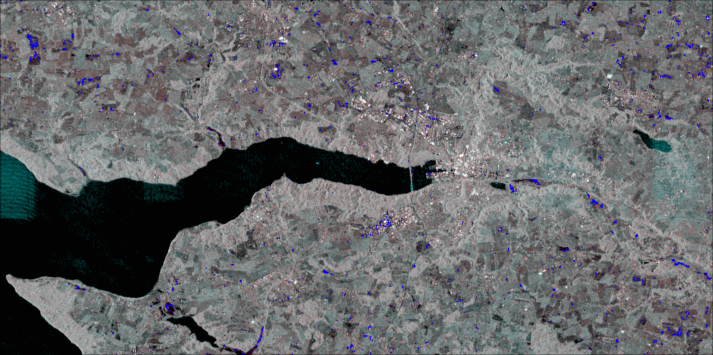

In [129]:
t_VH = [-24,-22,-2]


flood_band = 10 .*log10.(VH[1]);
ref_band = 10 .*log10.((VH[2].+VH[3])./2);

VHfinal_mask, VHflood_mask, VHref_mask = No_HSBA_floodmask(flood_band,ref_band,t_VH)

img = pretty_img(VH ,min_vh,max_vh);
img_flood = add_mask(img, VHflood_mask ,(0,0,1))
img_ref = add_mask(img, VHref_mask ,(0,0,1))
img_final = add_mask(img, VHfinal_mask ,(0,0,1))
add_mask(img, VHfinal_mask ,(0,0,1))

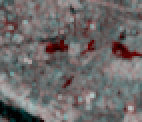

In [130]:
img[210:270,end-150:end-80]

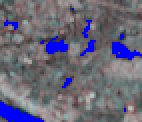

In [131]:
img_flood[210:270,end-150:end-80]

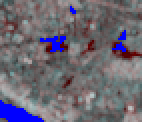

In [132]:
img_ref[210:270,end-150:end-80]

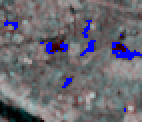

In [133]:
img_final[210:270,end-150:end-80]

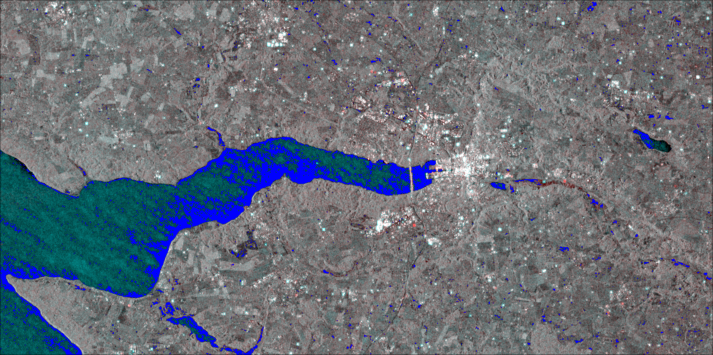

In [134]:
img = pretty_img(VV ,min_vv,max_vv);
img_flood = add_mask(img, VVflood_mask.&VHflood_mask ,(0,0,1))

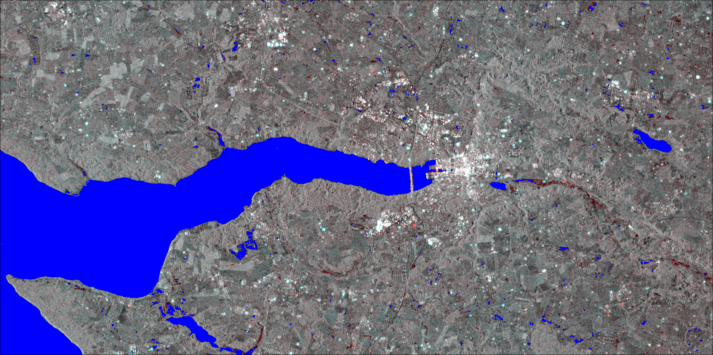

In [135]:
img = pretty_img(VV ,min_vv,max_vv);
img_ref = add_mask(img, VVref_mask.&VHref_mask ,(0,0,1))

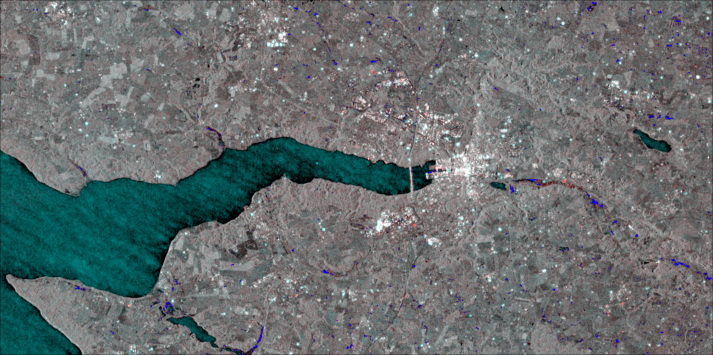

In [136]:
final_combi =  (VVflood_mask.&VHflood_mask) .& ((VVref_mask.&VHref_mask) .!= true)

img = pretty_img(VV ,min_vv,max_vv);
img_ref = add_mask(img, final_combi  ,(0,0,1))

In [137]:
FileIO.save("combi_test.png",img_ref)

In [74]:
function No_HSBA_floodmask(flood_band,ref_band,thresholds)
    change_band = flood_band.-ref_band;
    seed_mask = flood_band .<thresholds[1]
    
    # use optimize values to find flood mask
    rg_mask = (flood_band .<thresholds[2]) .& (change_band.<thresholds[3]) .| seed_mask 
    flood_mask, steps = region_growing(seed_mask,rg_mask);
    
    # Make region growing og refference image to find Permant water and false positives
    seed_mask_ref = ref_band .<thresholds[1]
    rg_mask_ref = (ref_band .<thresholds[2])
    ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);
    
    # Remove flase positives and permant water.
    final_mask = flood_mask .& (ref_mask .!=true);
    
    return final_mask, flood_mask, ref_mask
end

No_HSBA_floodmask (generic function with 1 method)

In [ ]:
aa